In this notebook i'll be implementing a inversion process + uncertainty quantification using the emcee sampler.

In [1]:
from pathlib import Path
import os
from multiprocessing import Pool
import multiprocessing
import time

# JAX configurations
os.environ["OMP_NUM_THREADS"] = "1"
os.environ['XLA_PYTHON_CLIENT_PREALLOCATE'] = 'false'
os.environ['XLA_PYTHON_CLIENT_ALLOCATOR']='platform'


import jax
import jax.numpy as jnp
# jax.config.update("jax_enable_x64", True)
jax.config.update('jax_default_device', jax.devices('gpu')[-1])


import emcee
import jax

import numpy as np
import equinox as eqx
import h5py


import matplotlib.pyplot as plt

# Loading synthetic dataset

Let's start by recreating our synthetic data.

In [2]:
TESTING_DATA_FILE = Path("../../outputs/poisson_pressure_simulations_test.h5")

with h5py.File(TESTING_DATA_FILE, "r") as f:
    print(f.keys())
    X = jnp.array(f["positions"])
    T = jnp.array(f["kl_transform_matrice"])


P_ref_file = Path("../../raw_data/pressure_ref.dat")
Y_ref_file = Path("../../raw_data/YS_ref.dat")

P_ref = jnp.array(np.loadtxt(P_ref_file))
Y_ref = jnp.array(np.loadtxt(Y_ref_file))

pos  = [255, 755, 1255, 1755, 2255,  265,  765, 1265, 1765, 2265,  275, 775,
        1275, 1775, 2275,  285,  785, 1285, 1785, 2285,  295,  795, 1295, 1795, 2295]

X_ref = X[pos, :]

SIGMA = 0.5

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


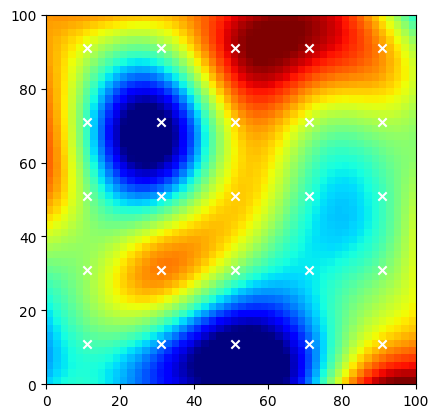

In [3]:
plt.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
plt.scatter(*X_ref.T, marker="x", c="w")

In [4]:
theta_ref = Y_ref@T

# Defining interval creation function

Lets define a function to detect the intervals of $\theta$ on which the network was trained on.

In [5]:
DATA_FILE = Path("../../outputs/poisson_pressure_simulations.h5")

with h5py.File(DATA_FILE, "r") as f:
    print(f.keys())
    theta = jnp.array(f["kl_coefficients"])

<KeysViewHDF5 ['Y_fields', 'kl_coefficients', 'kl_transform_matrice', 'positions', 'pressure_fields', 'sensor_position_indexes']>


In [6]:
def generate_intervals():
    min_, max_ = theta.min(axis=0), theta.max(axis=0)
    intervals = [(float(mi), float(ma)) for mi, ma in zip(min_, max_)]

    return intervals, min_, max_

INTERVALS, MIN, MAX = generate_intervals()

MIN, MAX

(Array([-4.133799 , -4.4780173, -4.4256234, -4.344691 , -4.465861 ,
        -5.003207 , -4.6752343, -4.063142 , -3.9797022, -4.084783 ,
        -4.301813 , -3.9780731, -4.853323 , -4.5483127, -4.579231 ,
        -4.435594 , -4.527643 , -4.194682 , -4.4632397, -4.656494 ,
        -4.451278 , -4.431556 , -4.2111244, -4.596984 ], dtype=float32),
 Array([4.1295114, 4.6543264, 3.8184648, 4.4239864, 4.4186835, 4.7119555,
        4.346513 , 3.8344748, 4.9299054, 4.2323565, 4.3842645, 4.2754087,
        4.1166024, 4.200948 , 3.9405203, 4.1797338, 4.5421233, 4.5354877,
        4.1899757, 4.101758 , 4.0647583, 4.3309145, 4.366222 , 4.010905 ],      dtype=float32))

In [7]:
def generate_initial_guess_normal(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.normal(key_k)*(a-b)/6 + (a+b)/2
        guesses.append(guess)
    

    return jnp.array(guesses)

def generate_initial_guess_uniform(key):

    guesses = []
    for a, b in zip(MIN, MAX):
        key, key_k = jax.random.split(key)
        guess = jax.random.uniform(key_k, minval=a, maxval=b)
        guesses.append(guess)
    

    return jnp.array(guesses)

# Loading DeepONet

Now load our deeponet from its file.

In [8]:
from typing import Callable

class DeepOnet(eqx.Module):
    branch_net: eqx.nn.MLP
    trunk_net: eqx.nn.MLP
    bias: jax.Array

    def __init__(
        self, 
        in_branch: int,
        in_trunk: int,
        width: int,
        depth: int,
        interact: int,
        activation: Callable,
        *,
        key
    ):
        """
        Simplified deeponet using twin hidden architectures
        """

        b_key, t_key = jax.random.split(key)

        self.branch_net = eqx.nn.MLP(
            in_branch,
            interact,
            width,
            depth,
            activation,
            key=b_key
        )

        self.trunk_net = eqx.nn.MLP(
            in_trunk,
            interact,
            width,
            depth,
            activation,
            final_activation=activation,
            key=b_key
        )

        self.bias = jnp.zeros((1,))

    
    def __call__(self, x_branch, x_trunk):
        """
        x_branch.shape = (in_size_branch,)
        x_trunk.shape = (1,)

        return shape: "scalar"
        """

        branch_out = self.branch_net(x_branch)
        trunk_out = self.trunk_net(x_trunk)

        inner_product = jnp.sum(branch_out*trunk_out, keepdims=True)

        return (inner_product + self.bias)[0]


In [9]:
key = jax.random.key(1325)
# key = jax.random.key(6757)

deeponet = DeepOnet(
    24,
    2,
    256,
    5,
    128,
    activation=jax.nn.relu,
    key=key
)

deeponet = eqx.tree_deserialise_leaves("../../outputs/fivespot_deeponet_best.eqx", deeponet)

# Defining log posterior

Let's now define a log prior and log likelihood to then define the log posterior. Our parameters are $(k, \beta, x_0, v_0)$ we know that they can't live outside our parameter space we can model this as a uniform prior over the space the DeepONet is trained on to avoid it getting out of it and letting it free over the trained space.

In [10]:
theta = jnp.array(np.random.uniform(-4, 4, size=24))

(theta >= MIN)
(theta <= MAX)

Array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True], dtype=bool)

In [11]:
@jax.jit
def log_likelihood(theta):
    out = jax.vmap(deeponet, in_axes=(None, 0))(theta, X_ref)
    return -0.5 * jnp.sum((P_ref - out) ** 2 / SIGMA**2)     


def log_prior(theta):
    if  all( (MIN <= theta) & (theta <= MAX) ):
        return 0.0
    return -jnp.inf


def log_probability(theta):
    lp = log_prior(theta)
    if not jnp.isfinite(lp):
        return -jnp.inf
    return lp + log_likelihood(theta)



# Running EMCEE

In [12]:
key = jax.random.key(42)
pos = []

for _ in range(2*24):
    key, skey = jax.random.split(key)
    pos.append(
        generate_initial_guess_normal(skey)
    )

    
pos = jnp.array(pos)

pos

Array([[ 1.4319935 , -0.66500413, -0.12648898, ...,  1.8385684 ,
         0.4193507 ,  0.521963  ],
       [ 0.3487379 ,  1.7214942 , -2.757879  , ...,  0.27726513,
        -2.0898561 ,  1.1387854 ],
       [-1.6091689 ,  3.1827872 ,  1.3938413 , ..., -0.2570145 ,
         0.17066552, -0.4622924 ],
       ...,
       [ 1.4503369 ,  1.671891  ,  0.28083706, ...,  0.24563992,
        -0.49933827,  1.3622518 ],
       [ 0.74861693, -2.5528939 ,  1.2867894 , ..., -3.3501666 ,
         1.348833  ,  0.5937365 ],
       [-2.2910254 , -0.9710882 ,  2.681048  , ...,  2.0189595 ,
        -0.316801  ,  2.0710106 ]], dtype=float32)

In [18]:
MULTI_PROCESSING = False

if MULTI_PROCESSING:

    with multiprocessing.get_context("spawn").Pool(processes=32) as pool:
    
        nwalkers, ndim = pos.shape
    
        sampler = emcee.EnsembleSampler(
            nwalkers, ndim, log_probability, pool=pool
        )
        start = time.perf_counter()
        sampler.run_mcmc(pos, 100_000, progress=True)
        end = time.perf_counter()
        multi_time = end - start
        print("Multiprocessing took {0:.1f} seconds".format(multi_time))
        print("{0:.1f} times faster than serial".format(serial_time / multi_time))





In [19]:
nwalkers, ndim = pos.shape

sampler = emcee.EnsembleSampler(
    nwalkers, ndim, log_probability
)

sampler.run_mcmc(pos, 100_000, progress=True);

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [2:31:56<00:00, 10.97it/s]


In [39]:
flat_samples = sampler.get_chain(discard=5000, flat=True, thin=15)
print(flat_samples.shape)


(303984, 24)


In [32]:
fitted  = flat_samples.mean(axis=0).tolist()
labels = [f"theta_{i}" for i in range(1, len(theta_ref)+1)]

print("Reference Vals vs Fitted Values\n")

for fit, ref, par in zip(fitted, theta_ref, labels):
    print(f"{par} - ref: {ref:5.2f} - fit: {fit:5.2f}")

Reference Vals vs Fitted Values

theta_1 - ref: -50.75 - fit: -0.52
theta_2 - ref: -151.88 - fit: -0.73
theta_3 - ref: 334.27 - fit:  0.88
theta_4 - ref: 215.62 - fit:  0.06
theta_5 - ref: -22.44 - fit:  1.28
theta_6 - ref:  6.03 - fit:  0.39
theta_7 - ref: 160.26 - fit:  0.43
theta_8 - ref:  7.90 - fit:  0.54
theta_9 - ref: -184.41 - fit: -0.31
theta_10 - ref: -123.43 - fit: -1.84
theta_11 - ref: -92.56 - fit: -1.68
theta_12 - ref: -146.26 - fit: -2.91
theta_13 - ref: 40.29 - fit: -0.33
theta_14 - ref: -38.17 - fit: -1.02
theta_15 - ref: 17.92 - fit:  0.58
theta_16 - ref: -40.48 - fit: -1.00
theta_17 - ref: 47.50 - fit: -0.39
theta_18 - ref: -32.84 - fit: -0.64
theta_19 - ref: 27.13 - fit: -0.34
theta_20 - ref:  7.86 - fit: -1.97
theta_21 - ref: 17.89 - fit:  0.08
theta_22 - ref:  5.39 - fit:  0.53
theta_23 - ref:  0.11 - fit:  0.19
theta_24 - ref: -2.24 - fit: -0.76


In [33]:
fitted = jnp.array(fitted)

[Text(0.5, 1.0, 'Recovered'), Text(0.5, 0, 'X'), None]

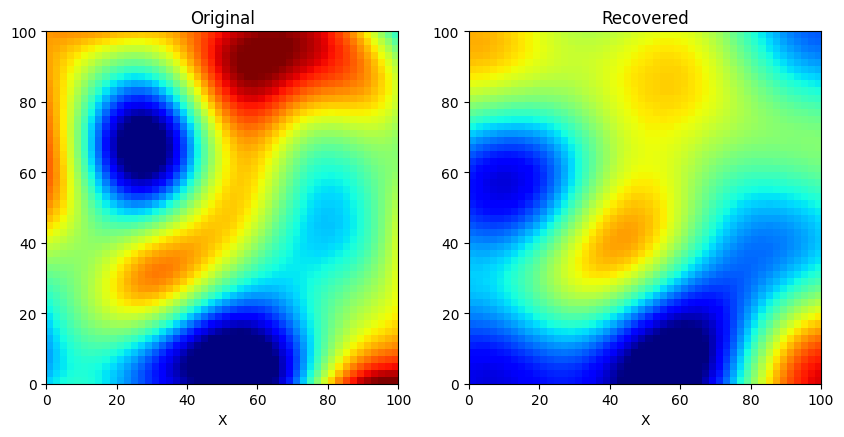

In [40]:
Y_recovered = (T@(fitted.reshape(-1, 1))).ravel().reshape(50, 50)

fig, [ax1, ax2] = plt.subplots(ncols=2, figsize=(10, 5))

ax1.imshow(Y_ref.reshape(50, 50), cmap="jet", origin="lower", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax1.set(title="Original", xlabel="X")
# ax1.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")

ax2.imshow(Y_recovered, origin="lower", cmap="jet", vmin=-2, vmax=2, extent=[0, 100, 0, 100])
ax2.set(title="Recovered", xlabel="X", label="Y")
# ax2.scatter(*X_ref.T, marker="o", c="w", edgecolors="k")

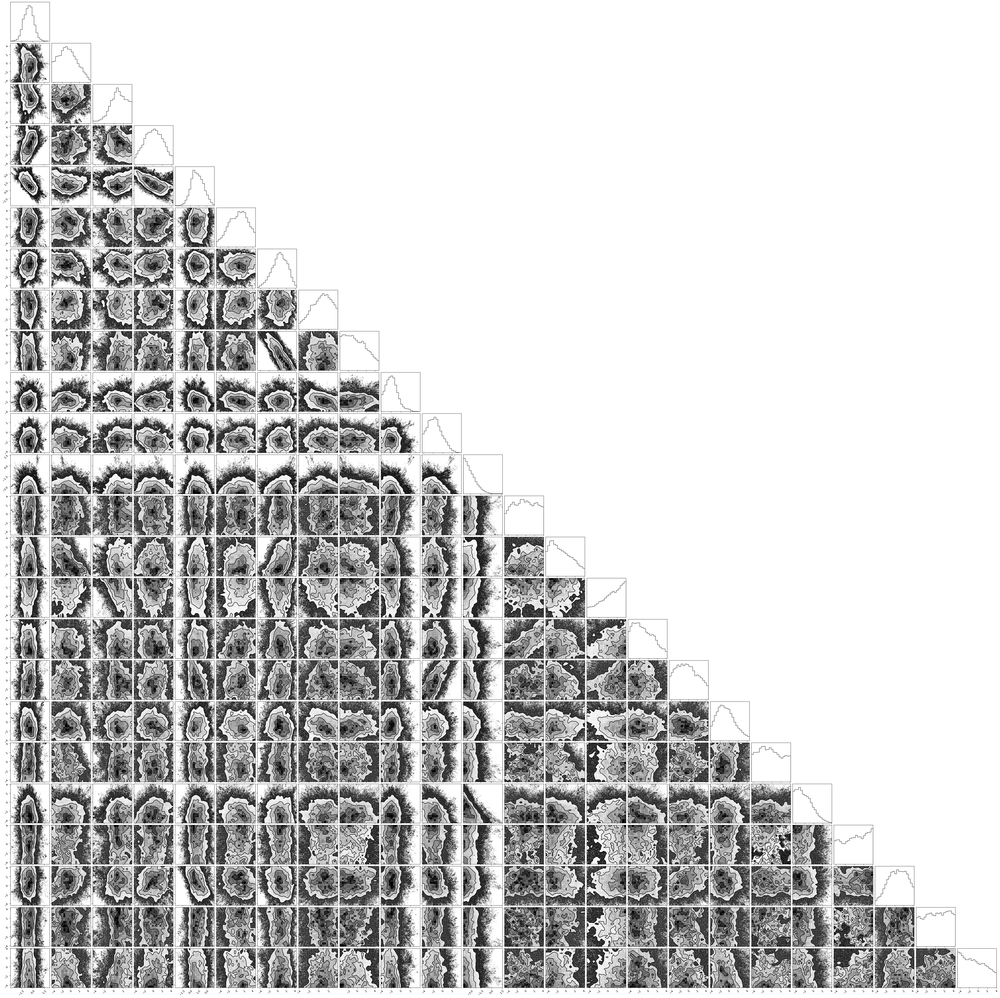

In [43]:
import corner
# labels = ["k", "b", "x0", "v0"]

fig = corner.corner(
    flat_samples,# labels=labels, truths=[k, beta, x0, v0]
);

fig.savefig("posteriors_emcee_lowdpi.png", dpi=25)